# Quão popular é o Presidente?
> "Experimentos com Gaussian Process para modelar a dinâmica da popularidde ao longo do tempo"

- toc: true
- badges: true
- comments: true
- author: Daniel Marcelino
- categories: [popularidade, Bolsonaro, Gaussian processes, pesquisas de opinião]
- image: images/gp-popularity.png

Trabalhar com séries temporais é realmente gratificante porque geralmente as séries de dados se relacionam com algo concreto. Uma aplicação bastante versátil são os [Processos Gaussianos] (https://en.wikipedia.org/wiki/Gaussian_process) - matematicamente são simples, bonitos e enxutos. Aléms disso, eles são muito flexíveis permitindo que você parametrize o modelo de modo a melhorar a interpretabilidade dos resultados.

Mas ... eles são difíceis de ajustar - o número de gradientes de computação escalam com o cubo do número de pontos de dados. E no contexto de modelagem bayesiano, estamos tentando estimar a distribuição _total_ dos resultados, não apenas _um_ único ponto (point estimate), o que aumenta bastante nosso desafio aqui.

Uma coisa que aprendi até agora nesse esforço de programar um modelo em PyMC é não ter medo do que você realmente teme. Em outras palavras, se um método lhe assusta, a melhor maneira de entendê-lo é trabalhar duro em um exemplo até onde for necessário. Isso ajudará você a cruzar os seus limites de compreensão e estabelecerá novas fronterias.

Então foi isso que fiz durantes semanas com os Processos Gaussianos! Tudo isso veio de uma pergunta simples que nós fizemos no **JOTA Labs**: **como a popularidade dos presidentes evolui dentro e entre os mandatos?** Eu participo de vários grupos de analistas e pesquisadores de opinião pública; portanto costumo ouvir pessoas comentando freneticamente sobre a última pesquisa de aprovação do governo. Em alguns casos as pessoas também questionarão se "as pesquisas estão erradas", se as empresas possuem algum viés, interesses setoriais específicos, métodos de coleta e análise duvidosos etc, mas isso é outra história. Nesses casos, precisamos estar atentos se estamos apenas reagindo ao ruído das pesquisas, mas também é plausível e muito natural a hipótese que um presidente experimente quedas e recuperação da popularidade no meio de seu mandato, não acha?

Para responder esta questão, compilamos alguns milhares de pesquisas de popularidade e aprvação dos últimos presidentes brasileiros, mas vamos restringir o período a partir de 1995. Vamos dar uma olhada para ver como estão organizados os dados, antes de mergulhar no modelo de Processos Gaussianos.

## Mostre me os dados!
A seguir todos os pacotes e ajustes que precisamos ter:

In [1]:
import sys
try:
    import warnings                                                   
    warnings.filterwarnings('ignore')
    import arviz as az
    import matplotlib.pyplot as plt
    import pandas as pd       
    import numpy as np
    import pymc3 as pm
    import xarray as xr
    import os
    import sqlite3
    import io
    import datetime
    import csv
    import watermark
    # import Quandl
    from IPython.display import display, HTML
    from dateutil.relativedelta import relativedelta
    from scipy.special import expit as logistic

except ImportError:
    print("Error: missing one of the libraries..")
    sys.exit()
    
%pylab inline
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# hide
RANDOM_SEED = 2021
np.random.seed(RANDOM_SEED)
az.style.use("arviz-darkgrid")
pd.options.display.float_format = '{:.2f}'.format

print('Running on PyMC3 v{}'.format(pm.__version__))
print('Running on arviz v{}'.format(az.__version__))
print(os.getcwd())
print(sys.argv[0])

Populating the interactive namespace from numpy and matplotlib
Running on PyMC3 v3.11.2
Running on arviz v0.11.2
/Users/marcelino/dmarcelinobr/pollbase/dashboards/models
/Users/marcelino/miniconda3/envs/polls/lib/python3.9/site-packages/ipykernel_launcher.py


In [2]:
con = sqlite3.connect('../../pollingpoint.db')

all_presidents = pd.read_sql(""" SELECT 
data_fim, empresa, positiva, regular, negativa, amostra, erro, nsnr, presidente, modo 
FROM aprovacao WHERE tipo = "Avaliação do governo federal"
ORDER BY data_fim; """, con=con) 

con.close()

# Converte para datetime 
all_presidents["data_fim"] = pd.to_datetime(all_presidents["data_fim"])

# Correct a few typos in the dataset
all_presidents["modo"] = all_presidents["modo"].replace("Online", "Internet")
all_presidents["modo"] = all_presidents["modo"].replace("FF", "Presencial")
all_presidents["presidente"] = all_presidents["presidente"].replace("Dilma Rousseff II", "Dilma/Temer")
all_presidents["presidente"] = all_presidents["presidente"].replace("Michel Temer", "Dilma/Temer")

# Replace NA with 1000 interviews 
all_presidents["amostra"] = all_presidents["amostra"].replace(np.nan, 1000)
all_presidents["amostra"] = all_presidents["amostra"].astype("int") 

# Index by field date
all_presidents.set_index("data_fim", inplace=True)

# restrict data to after Franco's term
all_presidents = all_presidents.loc[all_presidents.index >= pd.to_datetime("2011-01-01")]

# Convert approvals rates to proportion and compute total num approval
all_presidents[["positiva", "regular", "negativa"]] = ( 
    all_presidents[["positiva", "regular", "negativa"]].copy() / 100
)

# raw monthly average to get fixed time intervals
# TODO: replace by poll aggregation
df = all_presidents.groupby("presidente").resample("M").mean().reset_index(level=0).sort_index()

# Forward-Fill
df["amostra"] = df.groupby(["presidente"])["amostra"].transform(lambda x: x.fillna(method='ffill'))
df["positiva"] = df.groupby(["presidente"])["positiva"].transform(lambda x: x.fillna(method='ffill'))
df["regular"] = df.groupby(["presidente"])["regular"].transform(lambda x: x.fillna(method='ffill'))
df["negativa"] = df.groupby(["presidente"])["negativa"].transform(lambda x: x.fillna(method='ffill'))
df["nsnr"] = df.groupby(["presidente"])["nsnr"].transform(lambda x: x.fillna(method='ffill'))
df["erro"] = df.groupby(["presidente"])["erro"].transform(lambda x: x.fillna(method='ffill'))

# convert to nbr of successes
df["positiva_int"] = np.floor(df["amostra"] * df["positiva"]).astype("int")
df["negativa_int"] = np.floor(df["amostra"] * df["negativa"]).astype("int")

# compute total trials
df["total_int"] = df.positiva_int + df.negativa_int

# Reset the index
df = df.reset_index().rename(columns={"data_fim": "index"})

# index by data
df.set_index("index", inplace=True)

# hide
def governo(data):
    data = data.date()
    if data >= datetime.date(1995, 1, 1) and data <= datetime.date(1998, 12, 31):
        return 'FHC 1'
    elif data >= datetime.date(1999, 1, 1) and data <= datetime.date(2002, 12, 31):
        return 'FHC 2'
    elif data >= datetime.date(2003, 1, 1) and data <= datetime.date(2006, 12, 31):
        return 'LULA 1'
    elif data >= datetime.date(2007, 1, 1) and data <= datetime.date(2010, 12, 31):
        return 'LULA 2'
    elif data >= datetime.date(2011, 1, 1) and data <= datetime.date(2014, 12, 31):
        return 'DILMA 1'
    elif data >= datetime.date(2015, 1, 1) and data < datetime.date(2016, 5, 12):
        return 'DILMA 2'
    elif data >= datetime.date(2016, 5, 12) and data <= datetime.date(2016, 12, 31):
        return 'TEMER'
    elif data >= datetime.date(2019, 1, 1) and data <= datetime.date(2022, 12, 31):
        return 'BOLSONARO'
    else:
        return None

df['governo'] = df.index.map(governo)


# hide
BLOCOS = {
    "Fernando Henrique I": "left",
    "Fernando Henrique II": "right",
    "Lula da Silva I": "left",
    "Lula da Silva II": "left",
    "Dilma Rousseff I": "left",
    "Dilma/Temer": "left",
    "Jair Bolsonaro": "right",
}


df["bloco"] = df.presidente.replace(BLOCOS)

MANDATO_FLAGS = (
    (df.index.year == 1995) & (df.index.month == 1)
    | (df.index.year == 1999) & (df.index.month == 1)
    | (df.index.year == 2003) & (df.index.month == 1)
    | (df.index.year == 2007) & (df.index.month == 1)
    | (df.index.year == 2011) & (df.index.month == 1)
    | (df.index.year == 2015) & (df.index.month == 1)
    | (df.index.year == 2019) & (df.index.month == 1)
)
df["mandato"] = 0

df.loc[MANDATO_FLAGS, "mandato"] = 1


ELEICOES_FLAGS = (
    (df.index.year == 1994) & (df.index.month == 10)
    | (df.index.year == 1998) & (df.index.month == 10)
    | (df.index.year == 2002) & (df.index.month == 10)
    | (df.index.year == 2006) & (df.index.month == 10)
    | (df.index.year == 2010) & (df.index.month == 10)
    | (df.index.year == 2014) & (df.index.month == 10)
    | (df.index.year == 2018) & (df.index.month == 10)
)
df["eleicao"] = 0

df.loc[ELEICOES_FLAGS, "eleicao"] = 1

Agora, vamos carregar os dados em um dataframe chamado `df`. Você notará que, além dos dados de pesquisa, a tabela de dados também contém as taxas nominais de câmbio, ou seja, o valor do dólar em reais (baixado do site do [IPEA] (http://ipeadata.gov.br/exibeserie.aspx?serid=38389). Como essa variável geralmente é mencionada para avaliar o desempenho do governo ou equipe econômica, deve ter alguma correlação com a popularidade dos presidentes ao longo do mandato. Vamos usá-la como um preditor em nosso modelo.

Como explicarei em detalhes abaixo, estamos calculando a popularidade a cada mês, mas em alguns indicadores de fundamentos econômicos, como PIB e desemprego são divulgados trimestralmente, utros são mensais com inflação (IPCA, IGPM), e outros são dados diários, como o câmbio de moedas. Então, em alguns casos precisamos aplicar uma rolagem ou interpolação ou então a média do período (mensal) para poder preencher os valores desses índices para todo o index da tabela. Vale deixar claro que essas transformações empregadas são suposições (boas, educadas, mas suposições). A melhor forma de testarmos essas informações é verificando seu impacto nas inferências do modelo. Nós também poderíamos usar técnicas mais complexas para tentar prever esses índices econômicos como a inflação, o desemprego etc, ou mesmo usar o consenso das previsões de consultorias especializadas, mas inicialmente acho que podemos seguir com a estratégia mais simples.

In [3]:
def dif_mes(d1, d2):
    return d1.date().month - d2.date().month + (d1.date().year - d2.date().year) * 12


def fill_desemprego(x):
    if np.isnan(x['desocupacao']):
        return x['pme']
    else:
        return x['desocupacao']
    

def ipca_taxa_mensal(
        ipca: float):
        """
        Monthly Inflation Rate
        """
        return ((ipca/ipca.shift(1))-1)*100

def ipca_taxa_anual(
        ipca: float):
        """
        Annual Inflation Rate
        """
        return ((ipca/ipca.shift(12))-1)*100
    

def pib_taxa_mensal(
        pib: float):
        """
        Monthly GDP Rate
        """
        return ((pib/pib.shift(1))-1)*100
    
def pib_taxa_anual(
        pib: float):
        """
        Annual GDP Rate
        """
        return ((pib/pib.shift(12))-1)*100
    
    
# hide
fields = ['data', 'ipca', 'igp', 'igpm', 'divida_publica', 'cambio', 'pib', 'pme', 'desocupacao', 'salario_real', 'epu']

fundamentos = pd.read_csv(
    "../data/dados_fundamentos.csv",
    sep=",",
    skipinitialspace=True, 
    usecols=fields)

fundamentos["data"] = pd.to_datetime(fundamentos["data"])

fundamentos = fundamentos.sort_values("data")

# as timestamps variables:
fundamentos.index = pd.period_range(start=fundamentos.data.iloc[0], periods=len(fundamentos), freq="M")

fundamentos = fundamentos.drop("data", axis=1)

fundamentos = fundamentos.loc[fundamentos.index >= '1993-12']

fundamentos["ipca_mes"] = fundamentos["ipca"].diff()

fundamentos["ipca_var_mensal"] = ipca_taxa_mensal(fundamentos["ipca"]).round(2)

fundamentos["ipca_var_anual"] = ipca_taxa_anual(fundamentos["ipca"]).round(2)

fundamentos["Inflacao_acumulada"] = fundamentos["ipca_var_mensal"].cumsum().round(2)
    
fundamentos["pib_var_mensal"] = pib_taxa_mensal(fundamentos["pib"]).round(2)

fundamentos["pib_var_anual"] = pib_taxa_anual(fundamentos["pib"]).round(2)

fundamentos['ipca_no_ano'] = fundamentos.groupby(by=fundamentos.index.year)['ipca_var_mensal'].transform(lambda x: x.cumsum()).round(2)

fundamentos['pib_no_ano'] = fundamentos.groupby(by=fundamentos.index.year)['pib_var_mensal'].transform(lambda x: x.cumsum()).round(2)

# fundamentos["cambio_d_defl"] = (1 + fundamentos["cambio_d"])/(1 + fundamentos["ipca_var_mensal"]/100) - 1

mean_desemprego = fundamentos["desocupacao"].mean()

fundamentos['desocupacao'] = fundamentos.apply(lambda x : fill_desemprego(x),axis=1)

# don't do it
fundamentos["desocupacao"] = fundamentos["desocupacao"].replace(np.nan, mean_desemprego)

# add quarters to main dataframe:
df = df.reset_index()
df.index = pd.DatetimeIndex(df["index"].values).to_period("M")
df.index.name = "mensal"


# merge with unemployment:
df = df.join(fundamentos).reset_index().set_index("index")
df.index.name = "mes"

df["desocupacao"] = df.desocupacao.fillna(method="ffill")
df["pib_var_mensal"] = df.pib_var_mensal.fillna(method="ffill")
df["pib_var_anual"] = df.pib_var_anual.fillna(method="ffill")
df["ipca"] = df.ipca.fillna(method="ffill")
df["ipca_mes"] = df.ipca_mes.fillna(method="ffill")
df["ipca_var_mensal"] = df.ipca_var_mensal.fillna(method="ffill")
df["ipca_var_anual"] = df.ipca_var_anual.fillna(method="ffill")
df["ipca_no_ano"] = df.ipca_no_ano.fillna(method="ffill")
df["pib_no_ano"] = df.pib_no_ano.fillna(method="ffill")
df["igp"] = df.igp.fillna(method="ffill")
df["igpm"] = df.igpm.fillna(method="ffill")
df["pib"] = df.pib.fillna(method="ffill")
df["cambio"] = df.cambio.fillna(method="ffill")
df["epu"] = df.epu.fillna(method="ffill")
df["divida_publica"] = df.divida_publica.fillna(method="ffill")
df["salario_real"] = df.salario_real.fillna(method="ffill")


# display(HTML(fundamentos.to_html()))

In [4]:
# hide_input
df.to_csv("../data/complete_popularity_data.csv")

df

,mensal,presidente,positiva,regular,negativa,amostra,erro,nsnr,positiva_int,negativa_int,...,desocupacao,salario_real,ipca_mes,ipca_var_mensal,ipca_var_anual,Inflacao_acumulada,pib_var_mensal,pib_var_anual,ipca_no_ano,pib_no_ano
mes,,,,,,,,,,,,,,,,,,,,,
2011-01-31,2011-01,Dilma Rousseff I,0.51,0.30,0.07,1000.00,3.00,12.00,510,70,...,6.10,978.97,26.53,0.83,5.99,391.83,-6.34,15.32,0.83,-6.34
2011-02-28,2011-02,Dilma Rousseff I,0.51,0.30,0.07,1000.00,3.00,12.00,510,70,...,6.40,973.71,25.78,0.80,6.01,392.63,0.52,17.24,1.63,-5.82
2011-03-31,2011-03,Dilma Rousseff I,0.52,0.31,0.06,1000.00,2.10,12.00,515,60,...,6.50,976.28,25.66,0.79,6.30,393.42,3.85,11.62,2.42,-1.97
2011-04-30,2011-04,Dilma Rousseff I,0.52,0.31,0.06,1000.00,2.10,12.00,515,60,...,6.40,969.30,25.21,0.77,6.51,394.19,0.34,13.67,3.19,-1.63
2011-05-31,2011-05,Dilma Rousseff I,0.52,0.31,0.06,1000.00,2.10,12.00,515,60,...,6.40,963.81,15.51,0.47,6.55,394.66,4.93,15.91,3.66,3.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-31,2021-05,Jair Bolsonaro,0.27,0.22,0.49,2089.67,2.27,1.79,561,1031,...,14.60,1117.89,47.25,0.83,8.06,449.76,-1.05,22.65,3.18,1.51
2021-06-30,2021-06,Jair Bolsonaro,0.27,0.21,0.50,1936.75,2.46,1.95,525,972,...,14.10,1111.22,30.42,0.53,8.35,450.29,0.63,17.17,3.71,2.14
2021-07-31,2021-07,Jair Bolsonaro,0.25,0.21,0.52,1926.50,2.51,1.73,490,1004,...,14.70,1100.00,55.39,0.96,8.99,451.25,4.00,14.45,4.67,6.14


Para chegar a esse formato de dados existe um trabalho intenso transformações e de limpeza de dados envolvido. Talvez o mais importante é que realizamos uma média mensal simples para obter intervalos de tempo fixos, o que torna o cálculo mais fácil para o GP - e na verdade não é prática tão esotérica considerar que podemos "observar"  a popularidade do presidente com apenas uma vez por mês, graças à média (point estimate) de todas as pesquisas realizadas naquele mês.

Contudo, idealmente não faríamos isso, pois:

        1) quebra o aspecto puramente gerador do modelo (agora o modelo não leva como evidências as pesquisas brutas, mas sua média); 
        2) leva o modelo a "acreditar" que a dispersão nas pesquisas é menor do que realmente é realmente.

Ainda assim, como uma primeira implementação, vamos tornar nossas vidas mais fáceis, poupar tempo computacional para ver como isso funciona. Podemos sempre voltar ao modelo e experimentar outros ajustes, relaxando algumas dessaa suposições, se necessário.

Falando em tornar nossas vidas mais fáceis, vamos escrever uma função auxiliar para converter datetimes em números, em referência a uma determinada data. Isso será útil para usar o tempo como um preditor em nosso modelo -- mais precisamente, como uma entrada para nosso GP (se não estiver entendo nada, não se preocupe, vamos voltar a isso posteriormente).

In [5]:
def dates_to_idx(timelist):
    """Convert datetimes to numbers in reference to a given date"""

    reference_time = timelist[0]
    t = (timelist - reference_time) / np.timedelta64(1, "M")

    return np.asarray(t)


tempo_ref = dates_to_idx(df.index)
tempo_ref[:10]

array([0.        , 0.91993675, 1.93843816, 2.92408468, 3.94258609,
       4.92823261, 5.94673402, 6.96523543, 7.95088195, 8.96938335])

Vamos definir também uma função para padronizar os dados, assim a média = 0 e desvio padrão = 1. São esses valores padronizados que usaremos como nosso único preditor contínuo, a taxa de desemprego. Isso pode parecer meio absurdo para alguns indicadores, por isso precisamos estudar caso a caso. Mas de maneira geral, essa padronização tornará mais fácil definir nossos (priores) valores antecedentes para o coeficiente associado ao câmbio, e nosso modelo simulador terá um tempo melhor de amostragem - então, conseguimos matar dois 🐇🐇 coelhos com uma única 🏏 paulada. 


In [6]:
def standardize(series):
    """Standardize a pandas series"""
    return (series - series.mean()) / series.std()

## Construção do modelo

Agora é a hora de definir o modelo, o que deve deixar as coisas mais claras daqui para frente. Para mim as pesquisas são simplesmente realizações de uma distribuição Binomial: para cada pesquisa, um número $n$ de pessoas são selecionadas e entrevistadas, e número $y$ delas dizem que aprovam ou atribuem conceitos positivos ao trabalho do presidente, como "ótimo" ou "bom". Observe que ignoramos aqueles que não relatam opinião, porque seus números geralmente são insignificantes, então $n-y$ representa o número de pessoas que avaliam de maneira positiva o trabalho do presidente (esse é o nosso índice positivo de avaliação do presidente). Estatisticamente falando, temos $y \sim Binomial(n, p)$, onde $p$ é igual à proporção de pessoas que apóiam o presidente.

**Então, $p$ é o que realmente estamos tentando estimar aqui: dadas as pesquisas observadas, qual é a nossa inferência sobre a taxa de apoio verdadeiro e latente do presidente na população?** Mas nesse momento você deve estar ficando já incomodado, não é? Você está pensando: "mas as pesquisas não são observações _ruidosas_ da verdadeira taxa de apoio, que existe no mundo lá fora? É isso mesmo, você está ficando muito bom nisso!. As pesquisas são, de fato, estimativas que também trazem muito ruído e uma variedade de fatores são responsáveis por esses erros nas pesquisas. 

Portanto, precisamos levar esse fato em consideração, e uma maneira rápida de fazer isso é usar a [distribuição Beta-Binomial](https://en.wikipedia.org/wiki/Beta-binomial_distribution), que consegue lidar muito bem com dados superdispersos -- isto é, observações que são mais variáveis do que uma distribuição binomial clássica esperaria. Para ler mais sobre esses modelos (também chamados de "modelos de mistura contínua" que podem ser interpretados como um caso especial de uma mistura discreta), o capítulo 12 de [Richard McElreath's excelente _Statistically Rethinking_](https://nbviewer.jupyter.org/github/pymc-devs/resources/blob/master/Rethinking_2/Chp_12.ipynb) pode ser uma excelente referência.

Na distribuição Beta-Binomial, as probabilidades binomiais não são mais fixas, mas sim variáveis aleatórias extraídas de uma distribuição Beta comum. Portanto, além do número de experimentos amostrais, $n$, as distribuições Beta-Binomial são parametrizadas por dois valores reais, estritamente positivos, $\alpha$ e $\beta$, que controlam a distribuição Beta.

O fato é que $\alpha$ e $\beta$ geralmente não têm um significado real (pelo menos diretamente associado), então é mais fácil parametrizar a distribuição Beta com dois outros parâmetros, $p$ e $\theta$, que respectivamente correspondem aproximadamente à média e a sua precisão: para um dado $p$, um $\theta$ mais alto significa que estamos mais céticos quanto as probabilidades serem muito fracas ou muito fortes - aquelas próximas de 0 ou 1.

Não precisamos de um prior sobre $p$, pois esse valor será determinado por uma função determinística de nossa regressão. Mas precisamos de um prior para $\theta$. Um valor = 2 se traduz em um prior uniforme sobre as probabilidades, o que não é o que queremos. Na realidade, nós _sabemos_ a priori que a aprovação presidencial raramente ou nunca fica abaixo de 10% e acima de 90%. Então, para transmitir essa expectativa subjetiva para o modelo podemos definir $\theta = 10$. Você pode experimentar outros valores com o código abaixo para ter uma ideia de como a família Beta se comporta:

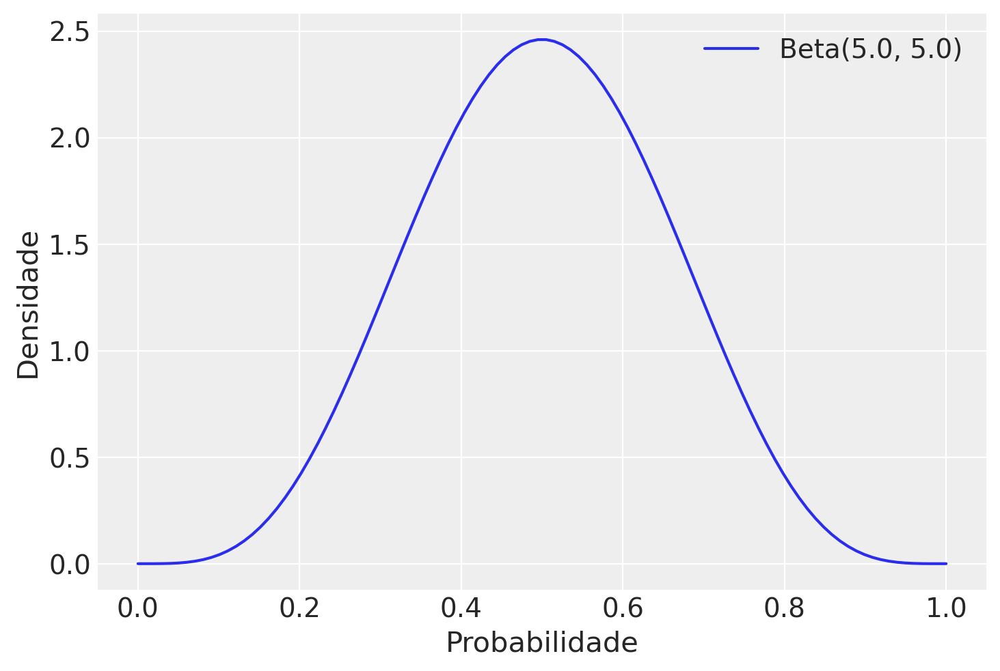

In [7]:
x_plot = np.linspace(0, 1, 100)
pbar = 0.5 # 0.35 for baseline 
theta = 10.0

plt.plot(
    x_plot,
    np.exp(pm.Beta.dist(pbar * theta, (1 - pbar) * theta).logp(x_plot).eval()),
    label=f"Beta({pbar * theta}, {(1 - pbar) * theta})",
)
plt.xlabel("Probabilidade")
plt.ylabel("Densidade")
plt.legend();

Até aqui o racional parece bastante transparente, e nós podemos ver que a ligação matemática entre $(p, \theta)$ e $(\alpha, \beta)$ é bastante simples:

$$ \alpha = p \times \theta $$
$$ \beta = (1 - p) \times \theta $$

Contudo, se quisermos assumir que a precisão é ao menos 10, nós teremos que usar um segredinho e definir $\theta = \tilde{\theta} + 10$, onde $\tilde{\theta} \sim Exponential(1)$, o qual parece funcionar bem porque as distribuções exponenciais tem valor mínimo de zero.

Agora vamos voltar nossa atenção para $p$, o parâmetro com o qual realmente nos importamos. Nós modelamos $p$ por meio da adição de um componente linear ($baseline + \beta_{lua-de-mel} \times mandato\_ flag + \beta_{desemprego} \times desemprego\_ dados$) e um componente não paramétrico (o GP, $gp\_tempo$). O GP basicamente nos permite informar ao modelo que o tempo e a popularidade variam, mas não sabemos a forma funcional exata desse relacionamento romântico (e monogâmico no nosso modelo). Então, basicamente nós gostaríamos que o modelo descobrisse para nós, GPs são muito bons nisso! Para garantir que $p$ fique entre 0 e 1 (porque estamos falando de uma probabilidade, lembra?), Usamos a [função de ligação logística](https://en.wikipedia.org/wiki/Logistic_function).

Agora temos todas as peças para construir nosso modelo! Precisamos apenas definir os valores de início priores para todos os nossos parâmetros desconhecidos. Isso é o que faremos na próxima seção, mas primeiro, vamos montar os blocos de componenetes do modelo para visualizar nossa "time machine de inferência":


$$y \sim BetaBinomial(\alpha=p \times \theta, \: \beta=(1 - p) \times \theta, \: n)$$

$$theta \sim Exponential(1) + 10$$

$$p = logistic(baseline + gp\_ tempo + \beta_{lua-de-mel} \times mandato\_ flag + \beta_{desemprego} \times log(desemprego\_ dados))$$

$$baseline \sim Normal(-0.6, 0.5)$$

$$\beta_{lua-de-mel} \sim Normal(-0.5, 0.3)$$

$$\beta_{desemprego} \sim Normal(0, 0.2)$$

$$gp\_ tempo \sim GP(0, \Sigma)$$

$$\Sigma = amplitude^2 \times Matern52(length\_ scale)$$

$$amplitude \sim HalfNormal(1)$$

$$lt\_ tendencia \sim Gamma(\alpha=4, \beta=2)$$

Como você pode ter percebido nós estamos usando o _logarítimo_ do câmbio, e não as taxas brutas de câmbio. Isso é motivado pelo fato de que acreditamos que o que mais importa para as pessoas quando elas pensam no preço do dólar é a sua _ordem de magnitude_ (a elasticidade), e não o seus valores absolutos.

Fora isso, o modelo deve parecer bastante familiar e até simples demais agora, exceto para as informações priores no GP e os coeficientes. Então, vamos atacar esses pontos a seguir. 

## Hora de decidir seus valores priores para o GP

Valores priores são muito importantes para ajustar os GPs de maneira adequada, então vamos dedicar algum tempo pensando sobre essas informações para obtermos um modelo mais refinado da popularidade dos presidentes. Note que este é um tutorial sobre como programar um GP no PyMC3, não um tutorial sobre a teoria dos GPs, então alguma familiaridade com os conceitos de GP é necessária. Se você precisar se atualizar sobre a teoria, dê uma olhada no [tutorial Mauna Loa de PyMC3](https://docs.pymc.io/notebooks/GP-MaunaLoa.html), o excelente estudo de caso de [Michael Betancourt](https://betanalpha.github.io/assets/case_studies/gaussian_processes.html) e o capítulo 21 de [Bayesian Data Analysis](http://www.stat.columbia.edu/~gelman/book/BDA3.pdf).


### Relações do Kernel

Precisamos de muita flexibilidade, por isso usaremos um kernel bastante comum, o Matern 5/2. Ele tem a vantagem de ser menos suave do que o kernel exponencial quadrático clássico, o que pode ser útil aqui, pois o GP deve ser capaz de pular de um regime para outro muito rapidamente quando um novo presidente é empossado (você verá que não existe uma continuidade no movimento da popularidade entre os mandatos, as mudançãs são geralmente muito grandes).

Provavelmente poderíamos fazer algo melhor aqui, sinalizando esses pontos de mudança para nosso GP (afinal, nós _sabemos_ quando um novo presidente é empossado, por isso devemos ser transparentes e contar isso para nosso modelo). Dessa forma, poderíamos usar kernels diferentes para cada presidente. Ou podemos olhar para os kernels não estacionários: o kernel do Matern é estacionário, o que significa que a covariância estimada entre os pontos de dados não varia dependendo do período em que estamos - talvez a avaliação dos brasileiros sobre seus presidentes tenha variado menos (ou seja, mais autocorrelacionados) nas décadas de 1990 e 2000, quando não havia tantas redes de notícias de TV 24 horas por dia, 7 dias por semana, tantos sites de notícia, redes sociais e WhatsApp?

Em suma, é fácil imaginar que o modo como a popularidade varia com o tempo (que é o que nosso GP tenta captar e nos dizer) varia de acordo com a personalidade de cada presidente e da época em que serviu ao país. As melhorias sugeridas acima integrariam essa premissa no modelo. Mas, novamente, esta é uma primeira versão de algo já completamente novo e experimental pra mim - vamos ver se, como o [Prêmio Nobel de Química de 2019](https://www.nobelprize.org/prizes/chemistry/2019/goodenough/facts/), é boa o suficiente.


### Amplitude -- Não vá muito alto!

O kernel Matern 5/2 é parametrizado com uma amplitude e escala de comprimento. A amplitude controla, surpreendentemente bem, a amplitude dos valores de GP realizados: quanto maior a amplitude, maiores serão as variações nos valores do GP. Você pode compreender melhor isso usando o eixo $y$ nos gráficos que você verá abaixo - o intervalo de valores que $f(x)$ pode assumir, sendo $f$ extraído do GP.

Os resultados das pesquisas aqui variam de 0 a 1, e os modelos de GP apenas parte da variação nas pesquisas. Também padronizaremos nosso preditor (dados da taxa de câmbio), o que significa que terá um desvio padrão de 1. Portanto, neste contexto, $Halfnormal(1)$ deve ser um valor prior regularizado fracamente ao longo dos processos.

### Duração ou comprimento da escala -- Não vá muito longe!

E quanto à escala de comprimento ou duração da escala? Você sabe o que ela controla? A escala de duração da tendência pode ser interpretada como o grau de correlação entre os valores de GP: quanto mais alto, mais suaves serão as funções extraídas do GP, porque seus valores realizados serão altamente correlacionados. De certa forma, podemos pensar nessa escala de comprimento como sendo a distância máxima no eixo $x$ na qual dois pontos no tempo ainda podem compartilham informações.

Nesse caso, podemos imaginar que as pesquisas realizadas há 2 ou 3 meses ainda têm um pouco de influência nos resultados de hoje (especialmente nos governos mais antigos da nossa série de dados com poucas pesquisas), mas provavelmente não é o caso das pesquisas de mais de 6 meses atrás. Portanto, precisamos de um prior que evite 0 (por definição, nunca faz sentido que a escala de durcação seja _exatamente_ 0) e restrinja valores acima de cerca de 4 meses. A família de distribuições Gamma é geralmente uma escolha útil aqui, pois é muito versátil e tem suporte sobre a linha positiva real. A seguir podemos ver alguns exemplos para melhorar nossa compreensão sobre a função dessas escalas:


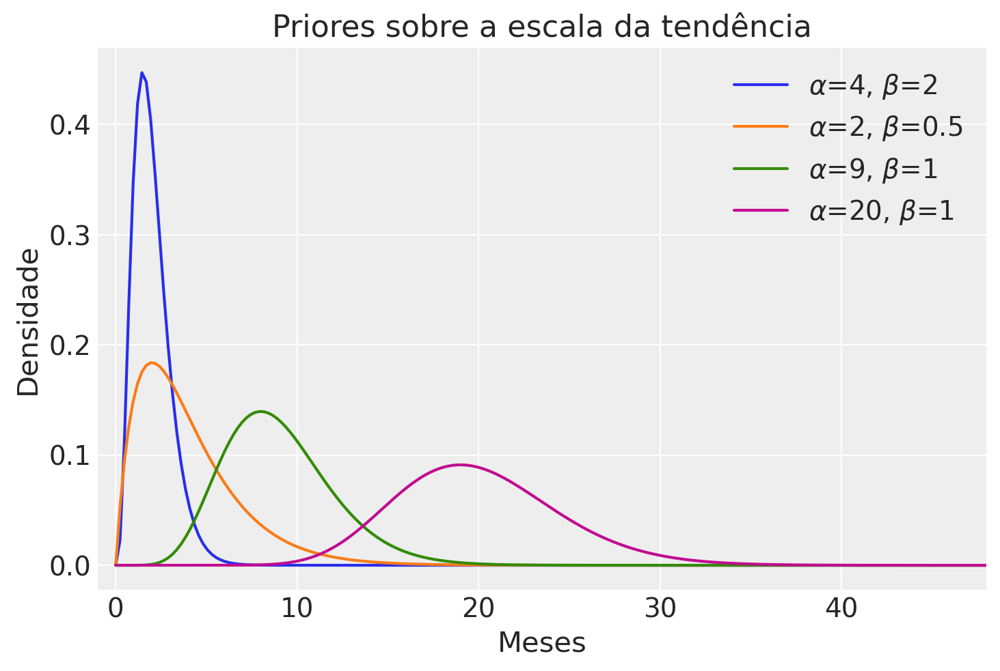

In [8]:
# collapse
x = np.linspace(0, 120, 500)
priors = [
    (r"$\alpha$=4, $\beta$=2", pm.Gamma.dist(alpha=4, beta=2)),
    (r"$\alpha$=2, $\beta$=0.5", pm.Gamma.dist(alpha=2, beta=0.5)),
    (r"$\alpha$=9, $\beta$=1", pm.Gamma.dist(alpha=9, beta=1)),
    (r"$\alpha$=20, $\beta$=1", pm.Gamma.dist(alpha=20, beta=1)),
]

fig = plt.figure()

for i, prior in enumerate(priors):
    plt.plot(x, np.exp(prior[1].logp(x).eval()), label=prior[0])

plt.xlim((-1, 48))
plt.xlabel("Meses")
plt.ylabel("Densidade")
plt.title("Priores sobre a escala da tendência")
plt.legend();

A linha azul, representando $Gamma(4, 2)$ agrada bastante aos meus olhos, porque a maior parte da massa de probabilidade está entre 0 e 4 meses, o que consideramos razoável acima.

Os GPs são bastante meta, então leva algum tempo para desenvolver intuição sobre eles. Uma coisa boa, porém, é que podemos relacionar os parâmetros do GP ao nosso caso de uso de real, o que o torna mais interpretável com a experiência. Este notebook [funções de média e covariância](https://docs.pymc.io/notebooks/GP-MeansAndCovs.html) e este [estudo de caso](https://betanalpha.github.io/assets/case_studies/probability_densities.html) são recursos excelentes para refletir sobre os valores priores no contexto dos GPs.

### Juntando o GP

O melhor que podemos fazer agora para tornar isso mais concreto é desenhar algumas funções do nosso GP, antes de aplicar a quaisquer dados reais. Isso nos ajudará a entender nosso modelo e determinar se nossas escolhas anteriores fazem sentido:

In [9]:
amplitude_tendencia = pm.HalfNormal.dist(1.0).random(1)
lt_tendencia = pm.Gamma.dist(alpha=4, beta=2).random(1)
cov_tendencia = amplitude_tendencia ** 2 * pm.gp.cov.Matern52(1, lt_tendencia)
    
prior_timepoints = np.linspace(0, 48, 200)[:, None]
K = cov_tendencia(prior_timepoints).eval()

gp_prior_samples = np.random.multivariate_normal(mean=np.zeros(K.shape[0]), cov=K, size=20_000)

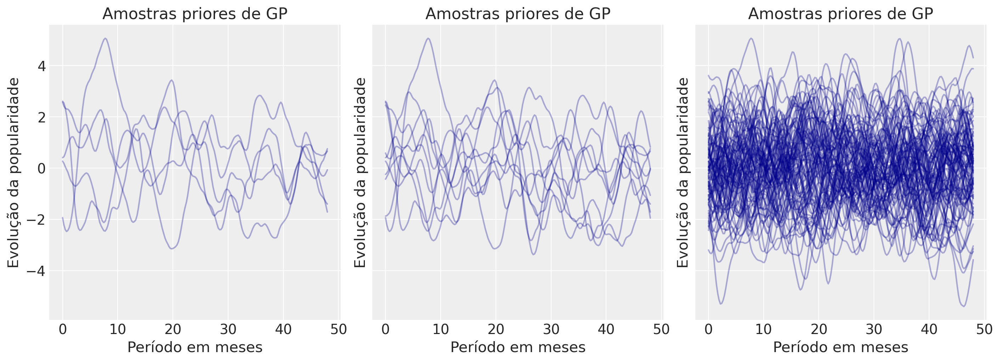

In [10]:
# hide_inputs
_, (left, mid, right) = plt.subplots(
    1,3, figsize=(14, 5), constrained_layout=True, sharex=True, sharey=True
)
for ax, samples in zip((left, mid, right), (5, 10, 100)):
    ax.plot(
        prior_timepoints,
        gp_prior_samples[:samples].T,
        color="darkblue",
        alpha=0.3,
    )
    ax.set_title("Amostras priores de GP")
    ax.set_xlabel("Período em meses")
    ax.set_ylabel("Evolução da popularidade");

Cada linha é representa uma realização do GP do valor prior. Na verdade, vemos o efeito de nossas escolhas de piores em ambas amplitude e escala de duração, com a maioria das funções flutuando entre -1 e 1 (amplitude) e a autocorrelação sendo limitada a cerca de 4 meses (escala de duração).

Como não especificamos uma média para nosso GP, o PyMC por padrão centraliza em 0, o que também é o que queremos: o GP está aqui para capturar a variação _residual_ da popularidade, uma vez que tenhamos executado baseline (média histórica), efeitos do câmbio e da lua-de-mel.

Os gráficos "espaguete" acima são úteis para fornecer uma ideia das funções individuais e das correlações entre seus valores, mas é difícil entender exatamente onde os diferentes quantis terminam. Para obter essa informação, os gráficos "ribbon" (fiaxas de opções) são mais interessantes para o que precisamos. Vamos calcular e exibir a mediana, 40-60%, 30-70%, 20-80% e 10-90% dos intervalos de quantis das amostras dos prioes do GP já projetas acima:

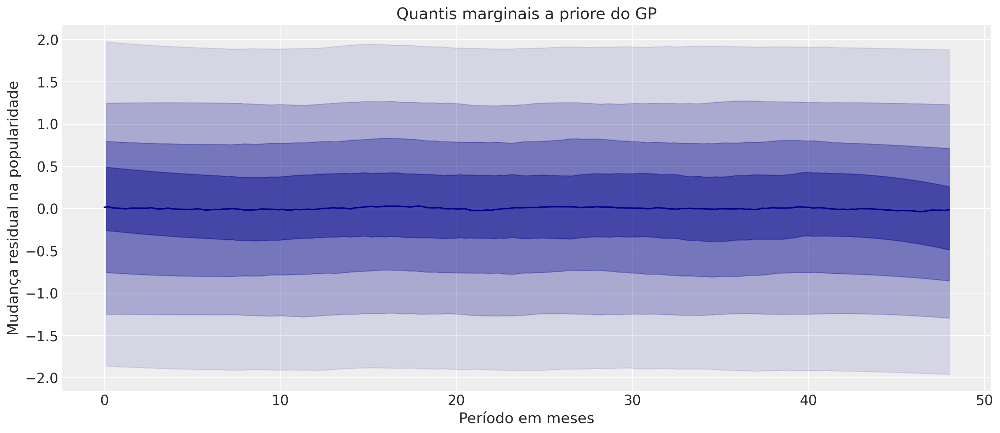

In [11]:
# hide_input
_, ax = plt.subplots(1, 1, figsize=(14, 6))

ax.plot(
    prior_timepoints.flatten(), np.median(gp_prior_samples, axis=0), color="darkblue"
)
az.plot_hdi(
    prior_timepoints.flatten(),
    gp_prior_samples,
    hdi_prob=0.2,
    ax=ax,
    color="darkblue",
    fill_kwargs={"alpha": 0.4},
)
az.plot_hdi(
    prior_timepoints.flatten(),
    gp_prior_samples,
    hdi_prob=0.4,
    ax=ax,
    color="darkblue",
    fill_kwargs={"alpha": 0.3},
)
az.plot_hdi(
    prior_timepoints.flatten(),
    gp_prior_samples,
    hdi_prob=0.6,
    ax=ax,
    color="darkblue",
    fill_kwargs={"alpha": 0.2},
)
az.plot_hdi(
    prior_timepoints.flatten(),
    gp_prior_samples,
    hdi_prob=0.8,
    ax=ax,
    color="darkblue",
    fill_kwargs={"alpha": 0.1},
)

ax.set_title("Quantis marginais a priore do GP")
ax.set_xlabel("Período em meses")
ax.set_ylabel("Mudança residual na popularidade");

Mais fácil de visualizar as diferentes expectativas, certo? Mas precisamos notar, entretanto, que esses gráficos ignoram a correlação entre os pontos de tempo, então eles subestimam a variação geral nas amostras de GP - e de fato você pode ver que o eixo $y$ está em uma escala bem menor do que os gráficos espaguete.


## Mas espere, tem mais priores para escolhermos ainda

Ainda temos valores priores para escolher para os efeitos da intercepto, da lua-de-mel e do câmbio 🍾

Nosso intercepto da regressão também é uma média da função do nosso GP -- o valor para o qual ele reverte ou regride quando os dados começam a faltar. Temos muitas informações: 50% de popularidade é historicamente alta para  presidentes brasileiros, então manter a média em zero é abaixo do ideal -- nosso parâmetro vive na escala logit, então um valor prior centrado em 0 significa uma expectativa centrada em $logistic(0) = 0,5$ no espaço amostral dos resultados.

Podemos fazer ainda melhor: com base em nosso conhecimento de domínio prévio, esperamos que a maioria dos presidentes tenha uma popularidade básica entre 20% e 50% - em outras palavras, os brasileiros raramente amam seus presidentes. Na realidade, muitas vezes _realmente_ não gostam deles, mas Lula II é uma exceção. Então, $Normal(-0.6, 0.5)$ parece razoável a esse respeito: espera que 95% da massa de probabilidade esteja entre -1,7 e 0,3, ou seja, $logistic(-1.7) = 15\%$ e $logistic(0.3) = 57\%$, com uma aprovação média de $logistic(-0.6) = 35\%$:

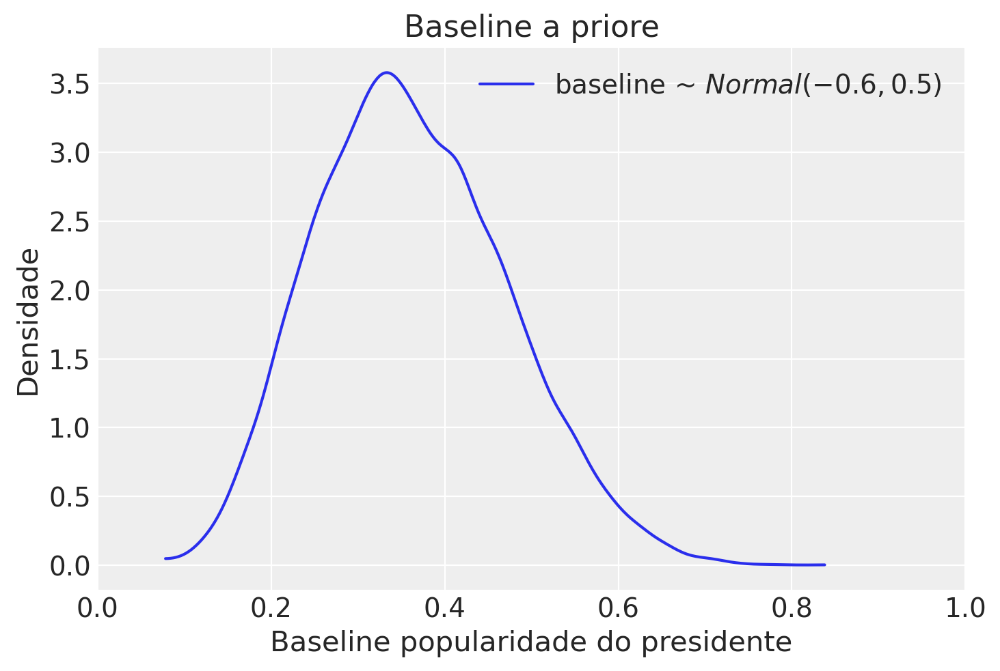

In [12]:
# hide_input
from scipy.special import expit as logistic

baseline_prior_samples = pm.Normal.dist(-0.6, 0.5).random(size=20_000)

ax = az.plot_kde(
    logistic(baseline_prior_samples),
    label="baseline ~ $Normal(-0.6, 0.5)$",
)
ax.set_xlim((0, 1))
ax.set_xlabel("Baseline popularidade do presidente")
ax.set_ylabel("Densidade")
ax.set_title("Baseline a priore");

Da mesma forma, temos muito conhecimento de prévio sobre o chamado período lua-de-mel -- um presidente recém-eleito tem uma espécie de bônus na sua popularidade quando assume o cargo pela primeira vez. Aqui, novamente, temos muito conhecimento de domínio: não devemos nos surpreender com grandes solavancos, já que não é incomum ver um presidente terminando seu mandato com 10-30% de popularidade e o novo assumindo com popularidade em torno de 50-60%. Portanto, um efeito centrado em torno de 35% e permitindo efeitos menores e maiores parece apropriado:

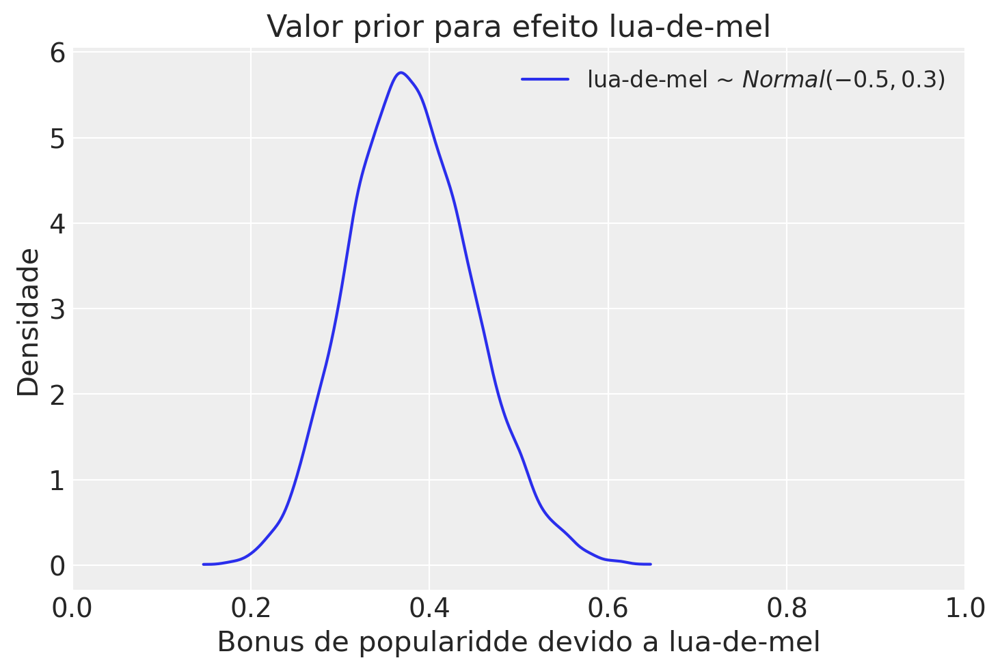

In [13]:
# hide_input
lua_de_mel_prior_samples = pm.Normal.dist(-0.5, 0.3).random(size=20_000)
from scipy.special import expit as logistic

ax = az.plot_kde(
    logistic(lua_de_mel_prior_samples),
    label="lua-de-mel ~ $Normal(-0.5, 0.3)$",
)
ax.set_xlim((0, 1))
ax.set_xlabel("Bonus de popularidde devido a lua-de-mel")
ax.set_ylabel("Densidade")
ax.set_title("Valor prior para efeito lua-de-mel")
ax.legend(fontsize=12);

No entanto, sobre o efeito do desemprego devemos esperar um impacto de pouca intensidade. Primeiro, porque as variáveis sociodemográficas geralmente têm impacto mais brando na literatura. Em segundo, porque a taxa de desemprego não é a única coisa que influencia a opinião dos eleitores sobre o presidente: há também, notavelmente, a polarização e o partidarismo, o que torna os movimentos de popularidade menos responsivos as flutuações na taxa de desemprego - se você realmente não gosta do presidente, provavelmente precisaria ver uma taxa de desemprego muito baixa antes de começar a creditá-lo por isso. Finalmente, as pessoas provavelmente não sabem o número atual exato do desemprego! Eles apenas têm uma memória vaga de onde está - também potencialmente influenciada por seu partidarismo.

**A beleza da modelagem bayesiana é que podemos integrar essa incerteza facilmente em nosso modelo: basta considerar a taxa de desemprego como uma variável aleatória! Então, na prática, colocamos uma distribuição de probabilidade nos dados de desemprego:**

$$incerteza\_desemprego = log(desemprego\_ dados) + incerteza\_delta$$
$$incerteza\_delta \sim Normal(0, 0.1)$$

Concretamente, isso significa que o câmbio é o resultado dos dados que observamos, mais algum ruído aleatório em torno dele, o que transmite a incerteza na mente das pessoas. Por que $\sigma = 0.1$ para $incerteza\_delta$. Bem, os dados são padronizados, então 0,1 é equivalente a 10% do desvio padrão dos dados. Já que estamos usando uma distribuição Normal, esse prior significa que 95% das vezes, esperamos que a "verdadeira" taxa de desemprego (aquela que as pessoas têm em mente ao pensar sobre isso) seja igual à taxa observada $\pm \, 0.2$, o que parece razoável quando as observações são padronizadas.

No geral, esperamos que o aumento da taxa de desemprego tenha um pequeno efeito negativo, mas não temos certeza. Então, vamos centralizar nosso prior em $0$ (ou seja, nenhum efeito esperado) e usar um $\sigma$ para obter uma fraca regularização (no espaço de log-odds): $\beta_{desemprego} \sim Normal(0, 0.2)$. Para ver o efeito desse ajsute antes, temos que inseri-lo na fórmula do nosso modelo, $popularidade = logistic(baseline + gp\_tempo + \beta_{desemprego} \times incerteza\_ desemprego$ (não nos importamos com o efeito lua-de-mel aqui no momento, porque o GP já é muito flexível quando não está limitado pelos dados, então não devemos ver muita diferença de qualquer maneira).

Só temos que gerar dados hipotéticos de desemprego. Novamente, conforme padronizamos os dados reais, simular dados entre -3 e 3 é amplamente suficiente para cobrir toda a gama de dados possíveis:

In [14]:
from scipy.special import expit as logistic

inlfacao_effect_prior_samples = pm.Normal.dist(0.0, 0.2).random(size=20_000)

fake_inflacao = np.linspace(-3, 3, 200)[None, :]

prior_approval = logistic(
    baseline_prior_samples[:, None]
    + gp_prior_samples
    + inlfacao_effect_prior_samples[:, None] * fake_inflacao
)

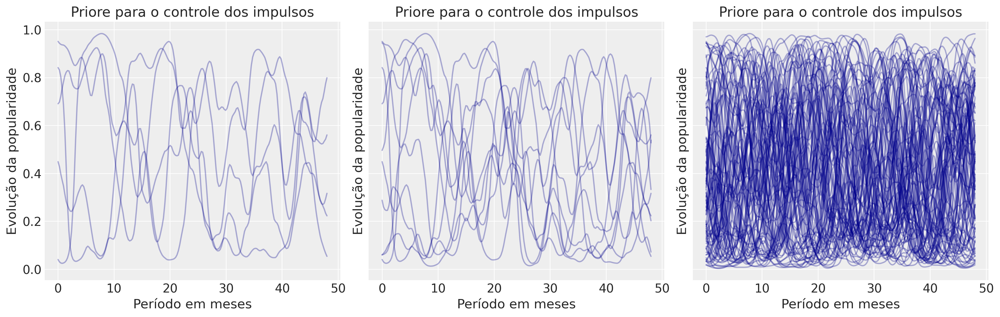

In [15]:
# hide_input
_, (left, mid, right) = plt.subplots(
    1, 3, figsize=(16, 5), constrained_layout=True, sharex=True, sharey=True
)
for ax, samples in zip((left, mid, right), (5, 10, 100)):
    ax.plot(prior_timepoints, prior_approval[:samples].T, color="darkblue", alpha=0.3)
    ax.set_title("Priore para o controle dos impulsos")
    ax.set_xlabel("Período em meses")
    ax.set_ylabel("Evolução da popularidade");

Novamente, cada linha é uma trajetória possível para a popularidade de qualquer presidente, mas desta vez não é apenas a variação residual capturada pelo GP - é a popularidade total do presidente e sua evolução no tempo. Observe que existem muitas trajetórias diferentes - até demais para ser honesto. Mas esse será o caso enquanto precisarmos de um kernel muito flexível para acomodar os efeitos dos limites do mandato de uma presidente devido as trocas de presidentes. Por enquanto parece que está tudo bem, mas se o modelo começar a apresentar problemas de sampling, ou mesmo se quisermos melhorá-lo futuramente, essa poderá ser uma das primeiras coisas que faremos.

Agora, vamos dar uma olhada no gráfico de quantis marginais (também conhecido como ribbon plot):

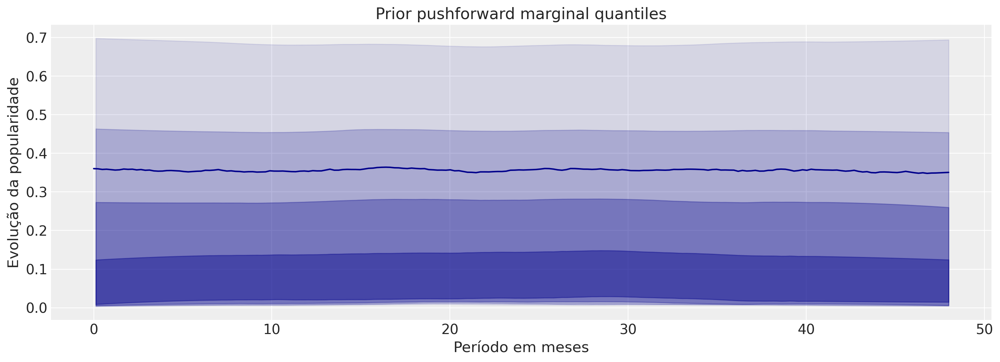

In [16]:
# hide_input
_, ax = plt.subplots(1, 1, figsize=(14, 5))

ax.plot(prior_timepoints.flatten(), np.median(prior_approval, axis=0), color="darkblue")
az.plot_hdi(
    prior_timepoints.flatten(),
    prior_approval,
    hdi_prob=0.2,
    ax=ax,
    color="darkblue",
    fill_kwargs={"alpha": 0.4},
)
az.plot_hdi(
    prior_timepoints.flatten(),
    prior_approval,
    hdi_prob=0.4,
    ax=ax,
    color="darkblue",
    fill_kwargs={"alpha": 0.3},
)
az.plot_hdi(
    prior_timepoints.flatten(),
    prior_approval,
    hdi_prob=0.6,
    ax=ax,
    color="darkblue",
    fill_kwargs={"alpha": 0.2},
)
az.plot_hdi(
    prior_timepoints.flatten(),
    prior_approval,
    hdi_prob=0.8,
    ax=ax,
    color="darkblue",
    fill_kwargs={"alpha": 0.1},
)

ax.set_title("Prior pushforward marginal quantiles")
ax.set_xlabel("Período em meses")
ax.set_ylabel("Evolução da popularidade");

O resultado parece bom, embora subestime a variação total novamente. A inclinação para baixo nos limites é provavelmente devido a uma combinação do efeito de distorção da função de ligação logística, a raridade dos dados nos limites (o que força o modelo a reverter para nossa baseline) e nossa baseline antes de colocar muita massa de probabilidade abaixo da baseline. E isso é o que realmente queremos: os presidentes passam mais tempo ao redor ou abaixo da linha de base do que acima. A melhoria que poderíamos fazer, no entanto, é dizer ao modelo que a popularidade deve tender para baixo para cada termo (ou seja, maior no início do que no final). Novamente, provavelmente precisaríamos de um kernel periódico para isso.


## Programando o modelo - It's show time!


Agora temos tudo para configurar nosso modelo no PyMC3! Como você verá, ele combina muito bem com a formulação de látex que vimos anteriormente. Existem apenas duas novidades para tornar nossas vidas mais fáceis: estamos usando os argumentos `coords` e` dims` em vez de` shape`; assim, conseguiremos selecionar os dados retornados por nosso modelo [com nomes em vez de dimensões brutas](https://oriolabril.github.io/oriol_unraveled/python/arviz/pymc3/xarray/2020/09/22/pymc3-arviz.html). Em segundo lugar, estamos usando o [container `pm.Data`](https://docs.pymc.io/notebooks/data_container.html), para tornar o modelo informado dos dados que passamos; isso tornará o processo subsequente de gerar projeções e previsões mais fáceis.

In [17]:
COORDS = {"temporal": df.index}

# solução para taxas negativas 
df[df.ipca_var_mensal < 0.0 ] = 0.001 

with pm.Model(coords=COORDS) as inflacao_latent_gp:
    # prior sobre o intercepto em escala logit
    β0 = pm.Normal("β0", -0.7, 0.5)

    # prior sobre o coeficiente do efeito da lua-de-mel
    β_luademel = pm.Normal("β_luademel", -0.5, 0.3)

    # prior sobre o coeficiente do logarítimo da inflacao
    β_log_inflacao = pm.Normal("β_log_inflacao", 0.0, 0.1)

    # Tedência de longa duração
    # prior sobre a estimativa do desvio padrão da tendência 
    σ_tendencia = pm.HalfNormal("σ_tendencia", sigma = 0.8)
    ℓ_tendencia = pm.Gamma("ℓ_tendencia", alpha=4, beta=2)
    cov_tendencia = σ_tendencia ** 2 * pm.gp.cov.Matern52(1, ℓ_tendencia)

    # instantiate gp
    gp = pm.gp.Latent(cov_func = cov_tendencia)
    
    # Prior for coefficient evaluate GP at time points
    gp_tempo = gp.prior("gp_tempo", X=tempo_ref[:, None])

    # data
    mandato = pm.Data("mandato", df.mandato.values, dims="temporal")
    
    stdz_inflacao_log = pm.Data(
        "stdz_inflacao_log",
         standardize(np.log(df.ipca_var_anual)).values,
        dims="temporal",
    )
    
    # Dados da inflação são incertos, até dados passados são incertos
    # sd = 0.1 says uncertainty on point expected btw 20% of data std 95% of time
    Δ_inflacao = pm.Normal("Δ_inflacao", mu=0.0, sigma=0.1, dims="temporal")
    Δ_incerteza = stdz_inflacao_log + Δ_inflacao 

    # overdispersion parameter
    θ = pm.Exponential("θ_dispersao", 1.0) + 10.0

    p = pm.Deterministic(
        "p",
        pm.math.invlogit(
            β0 + gp_tempo + β_luademel * mandato + β_log_inflacao * Δ_incerteza
        ),
        dims="temporal",
    )
    
    y = pm.BetaBinomial(
        "aprovacao",
        alpha=p * θ,
        beta=(1.0 - p) * θ,
        n=df.amostra,
        observed=df.positiva_int,
        dims="temporal",
    )

E agora é a hora de _finalmente_ executar nosso modelo 🥳. Vamos executar o modelo com 8 cadeias, extraindo 2.000 amostras em cada uma delas. Esta é uma boa prática porque:
        
        1) cada cadeia é bastante longa, então deve ser capaz de eventualmente explorar regiões problemáticas, se houver;
        2) cada cadeia começa sua exploração em um ponto diferente no espaço (y), aumentando nossas chances de explorar _todos_ os conjuntos ou dimensões.

In [18]:
CHAINS = 3
SEED = 12345
DRAWS = 2000

SAMPLE_KWARGS = {
    'tune': DRAWS//2,
    'draws': DRAWS,
    'cores': CHAINS,
    'random_seed': [SEED + i for i in range(CHAINS)],
    'return_inferencedata': True,
    'target_accept':0.95,
    'idata_kwargs':{
            "dims":{"gp_tempo": ["temporal"], "gp_tempo_rotated_": ["temporal"]}
    }
}



with inflacao_latent_gp:
     # Explore and Sample the Parameter Space
    trace_inflacao = pm.sample(**SAMPLE_KWARGS)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [θ_dispersao, Δ_inflacao, gp_tempo_rotated_, ℓ_tendencia, σ_tendencia, β_log_inflacao, β_luademel, β0]


Sampling 3 chains for 1_000 tune and 2_000 draw iterations (3_000 + 6_000 draws total) took 692 seconds.


0, dim: temporal, 129 =? 129


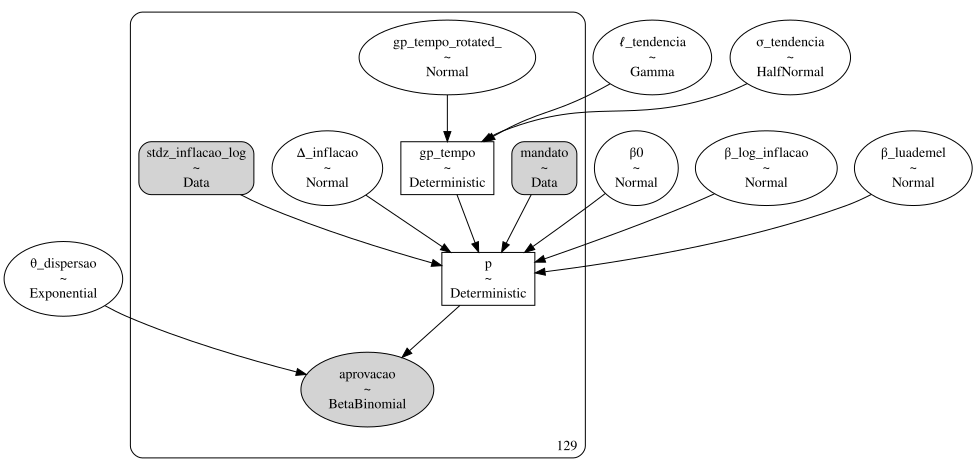

In [19]:
# conda install python-graphviz -n polls
ph = pm.model_to_graphviz(inflacao_latent_gp)
ph.render("../figures/inflacao_latent_gp", format="png")

pm.model_to_graphviz(inflacao_latent_gp)

## Diagnosticando o modelo -- O que você está sentindo? Qual é o seu problema?

O modelo executou sem avisos, sem divergências e um tempo de amostragem que parece excessivo, mas considerando todo o tempo percorrido precisamos das um desconto: 24.000 amostras em 212 min ou 3,5 horas (incluindo ajuste, que sempre leva mais tempo), ou seja, são quase 2 amostras por segundo.

Então até aqui não temos bandeiras vermelhas. Isso não significa que nosso modelo ainda seja bom, mas aumenta as chances de que seja. Vamos dar uma olhada no trace plot (gráfico de rastreamento) para ter certeza de que a amostragem foi bem produzida:

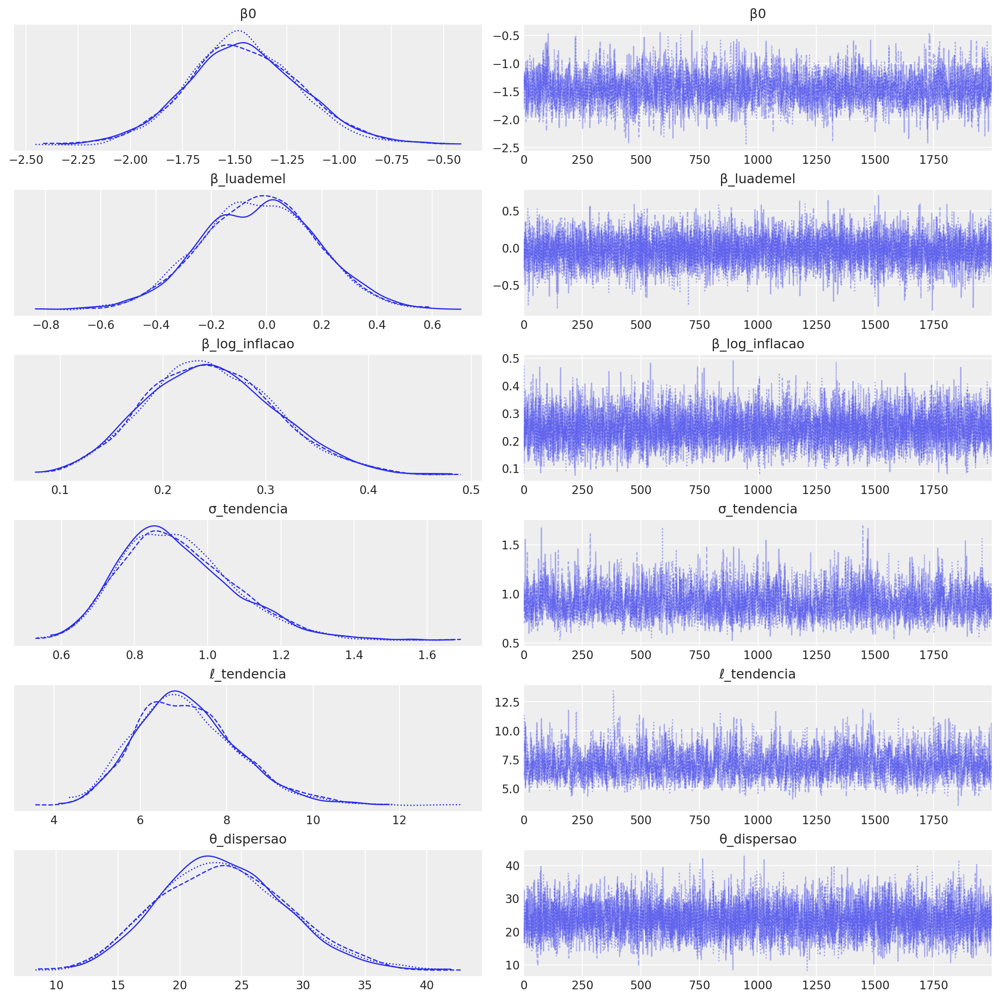

In [20]:
az.plot_trace(
    trace_inflacao, compact=True, var_names=["~Δ_inflacao", "~p", "~gp_tempo", "~gp_tempo_rotated_"]
);

In [21]:
trace_inflacao

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data
	> constant_data

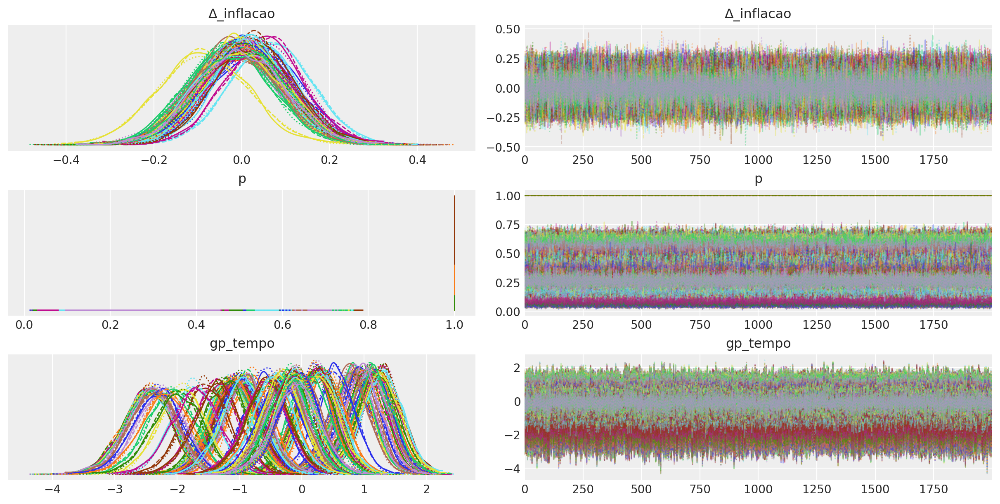

In [22]:
az.plot_trace(
    trace_inflacao,
    var_names=["Δ_inflacao", "p", "gp_tempo"],
    compact=True,
    coords={"temporal": trace_inflacao.observed_data.temporal[:300]},
);

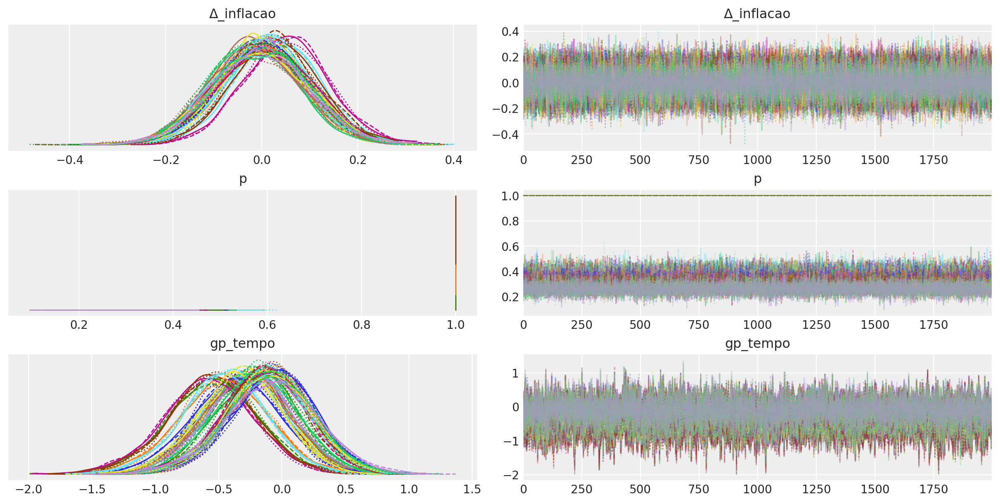

In [23]:
# hide
az.plot_trace(
    trace_inflacao,
    var_names=["Δ_inflacao", "p", "gp_tempo"],
    compact=True,
    coords={"temporal": trace_inflacao.observed_data.temporal[100:]},
);

Bem, de fato, todos parece muito bom! As cadeias estão se misturando bem para todos os parâmetros, conforme indicado pelos KDEs (gráficos à esquerda), e mostram um comportamento de passeio aleatório, conforme evidenciado pelos "caterpillars" nos gráficos à direita.

> Quer saber mais detalhes sobre trace plots? [Este blog](https://oriolabril.github.io/oriol_unraveled/python/arviz/matplotlib/2020/06/20/plot-trace.html) certamente pode ajudar muito 👌

Agora vamos analisar o pair plot para ver se as distribuições posteriores geradas exibem alta correlação ou algo ainda pior: degenerescências de funil 😱

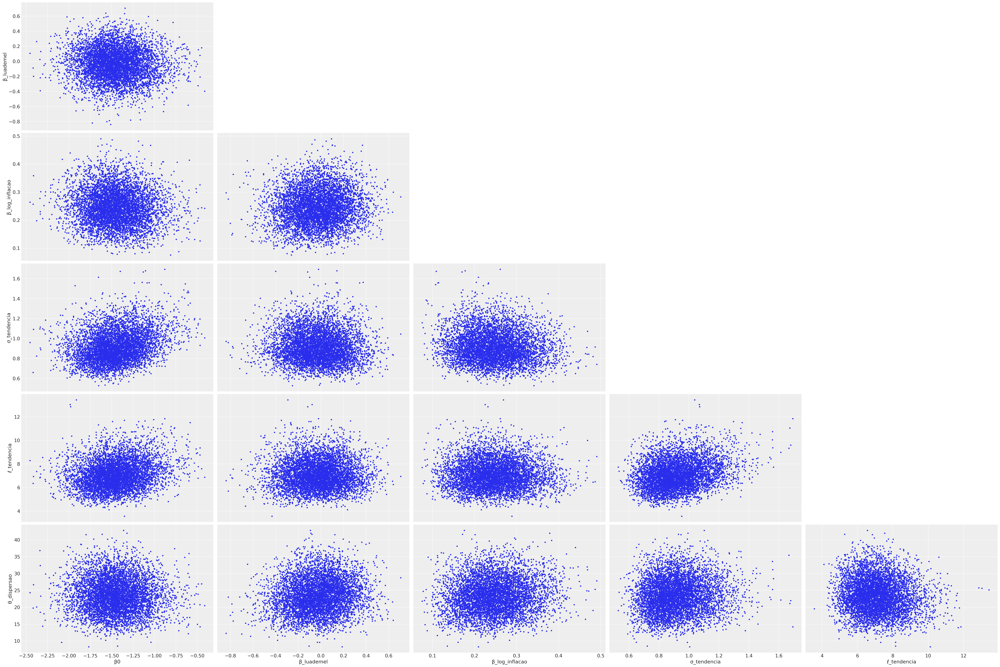

In [24]:
az.plot_pair(
    trace_inflacao,
    var_names=["~Δ_inflacao", "~p", "~gp_tempo", "~gp_tempo_rotated_"],
    divergences=True,
);

Tudo parece bom até aqui! Quase todos os gráficos parecem bolas difusas, sugerindo que não há correlações posteriores específicas entre nossos parâmetros. Vemos, entretanto, que pode haver algum problema para altos valores de `amplitude_tendencia` e` lt_tendencia` (os dois parâmetros de nosso kernel GP), por uma razão que teríamos que investigar. Mas, como pensamos muito sobre esses antecedentes de antemão e escolhemos distribuições céticas em relação a valores altos, parece que fomos capazes de evitar que essas degenerescências acontecessem - estilo __Minority Report_ 🤙 

Tudo parece estar correndo bem com o modelo até aqui, apenas para ver os resultados de uma outra perspectiva vamos olhar algumas dessas opções de visualizações [ArviZ](https://arviz-devs.github.io/arviz/):

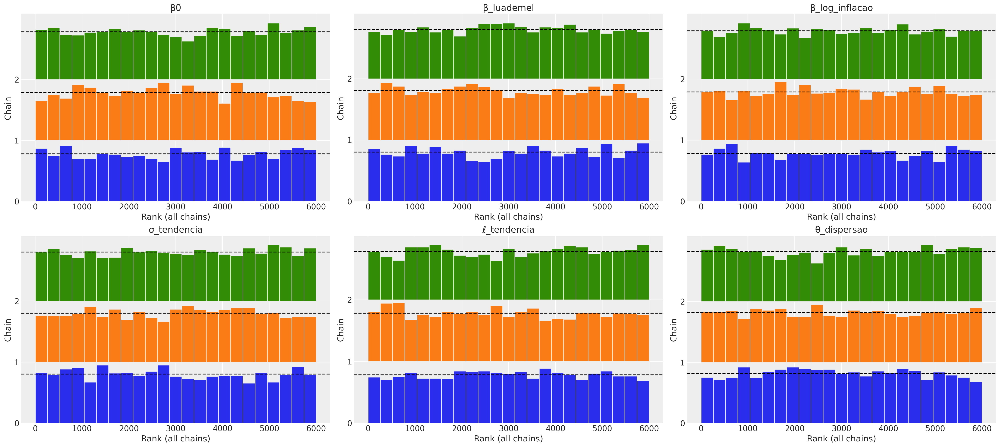

In [25]:
az.plot_rank(trace_inflacao, var_names=["~Δ_inflacao", "~p", "~gp_tempo", "~gp_tempo_rotated_"]);

"Isso parece sensacional Daniel... mas como eu leio esses gráficos?" 🤔 Hum, bem, como apresentado no [paper original](https://arxiv.org/abs/1903.08008):

> Rank plots are histograms of the ranked posterior draws (ranked over all chains) plotted separately for each chain. If all of the chains are targeting the same posterior, we expect the ranks in each chain to be uniform, whereas if one chain has a different location or scale parameter, this will be reflected in the deviation from uniformity. If rank plots of all chains look similar, this indicates good mixing of the chains.

E aqui, nossos rank plots parecem estar bem uniformes, então, de novo, tudo parece bem! Para ver alguns exemplos de rank plots indicando problemas, veja os exemplos [nesta página](https://arviz-devs.github.io/arviz/api/generated/arviz.plot_rank.html)

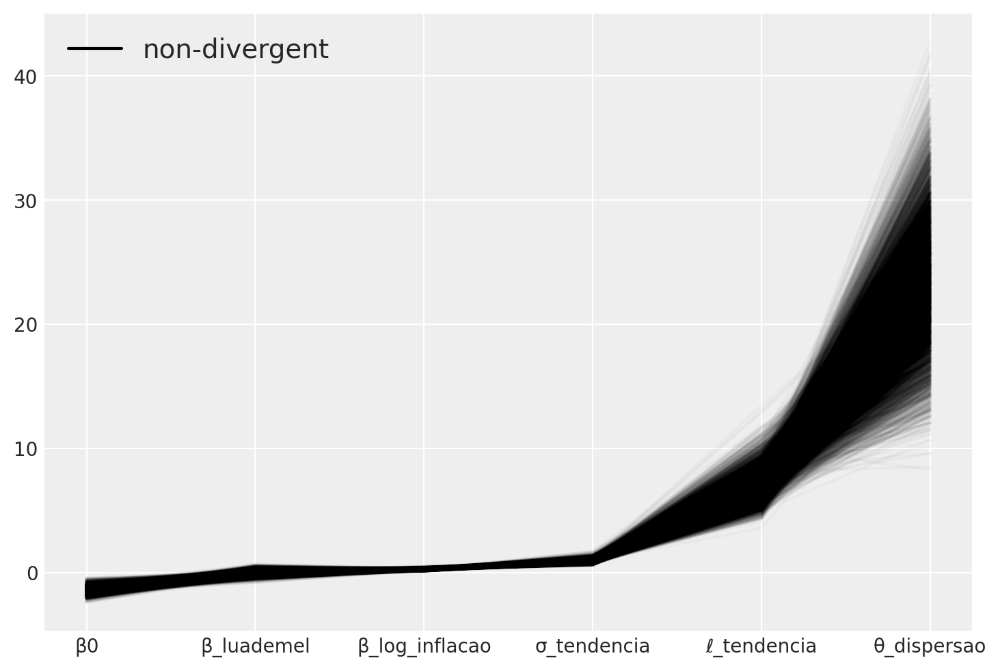

In [26]:
# hide
az.plot_parallel(trace_inflacao, var_names=["~Δ_inflacao", "~p", "~gp_tempo", "~gp_tempo_rotated_", "θ_dispersao"]);

## Prevendo a popularidade -- Eu vejo o futuro!

Plots e diagnósticos são bons para nos mostrar se houve um problema computacional em nosso modelo, mas infelizmente eles não nos dizem se nosso modelo é bom em prever tudo o que queremos prever. Essa parte é sempre muito específica para o modelo e caso em questão, portanto, não existe um método universal. Poderíamos olhar a tabela de resumo de nossos coeficientes para obter uma visão agregada do efeito de cada componente setimado:

In [27]:
az.summary(
    trace_inflacao, var_names=["~Δ_inflacao", "~p", "~gp_tempo", "~gp_tempo_rotated_"], round_to=2
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β0,-1.45,0.28,-1.97,-0.92,0.01,0.00,2985.99,3687.68,1.00
β_luademel,-0.03,0.21,-0.42,0.36,0.00,0.00,6647.23,4725.11,1.00
β_log_inflacao,0.25,0.06,0.13,0.37,0.00,0.00,6314.05,4297.34,1.00
σ_tendencia,0.92,0.16,0.66,1.22,0.00,0.00,2438.02,3551.74,1.00
ℓ_tendencia,7.10,1.20,4.94,9.32,0.03,0.02,1984.09,2500.54,1.00
θ_dispersao,23.53,5.09,14.29,33.18,0.07,0.05,4816.89,3918.76,1.00


In [28]:
# logistic sigmoid
from scipy.special import expit as logistic

logistic(-0.61)

0.35205919791934975

In [29]:
from scipy.special import expit as logistic
logistic(-0.11)

0.47252769565540637

In [30]:
from scipy.special import expit as logistic

logistic(-0.01)

0.49750002083312506

**Mas o que isso significa? Qual é a relação com popularidade?**
Além de nos dar uma ideia da direção e magnitude da covariância entre cada parâmetro do modelo e a popularidade do presidente (todos os outros mantidos constantes), uma simples tabela de resumo como essa acima não transmite muita coisa.

Podemos usa essas informações como uma "gut check": a popularidade média (média histórica ou baseline) é $logistic (-0.63) = 0,35$. O efeito lua-de-mel é de fato bastante positivo comparado ao baseline estimado pelo modelo, enquanto um aumento no preço dólar está associado a uma ligeira diminuição na popularidade. Você acha que todas essas inferências são consistentes com nosso conhecimento de domínio? 

A melhor maneira de entender tudo isso é prever novos dados (ou seja, "out-of-sample") e visualizar essas projeções. Portanto, vamos fazer previsões para três meses fora da amostra! Para isso, precisamos dos dados de tempo:

In [31]:
MAX_OBSERVACAO = len(df.index)
OOS_MESES = 3  # 1 quarter out-of-sample
# to solve the missmatch os sizes I'm adding -1 
MAX_TEMPO = MAX_OBSERVACAO + OOS_MESES

oos_tempo = np.linspace(0, MAX_TEMPO, MAX_TEMPO)[:, None]


In [32]:
MAX_TEMPO

132

In [33]:
len(df.index)

129

Não há troca de presidente ou mesmo de eleição presidencial no horizonte previsto, portanto, nosso novo vetor `mandato_flag` é todo 0, o que significa que desaparece de nossa regressão. No entanto, precisamos de novos dados do câmbio para os próximos três meses - e isso é divertido, porque podemos ser explorar qualquer ceneario!

O que são valores razoáveis? Existem muitos caminhos que podemos tentar. Convenientemente, estamos prevendo apenas um trimestre, então precisamos apenas de um ponto de dados para o dólar - e então plugamos o ruído aleatório que inferimos com nosso modelo (`incerteza_inflacao`), então, na realidade, obteremos 3 valores que estão próximos um do outro.

O caminho que percorreremos aqui é muito simples: vamos supor que o dólar fique em torno de seu último valor, com algum ruído igual ao desvio padrão que observamos na amostra de dados. Vamos escrever uma pequena função para fazer todas essas etapas de maneira fácil e robusta:

In [34]:
log_inflacao = np.log(df.ipca_var_anual)


def generate_oos_inflacao_data(center: float, oos_meses: int) -> np.ndarray:
    """
    Generate out-of-sample inflation data around `center` and for `oos_months`.
    """
    # inflation is around `center`
    ppc_inflacao = np.random.normal(
        loc=center,
        scale=df.ipca_var_anual.std(),
        size=oos_meses // 3,
    )
    # data only observed quarterly, so need to forward-fill
    ppc_inflacao = np.repeat(ppc_inflacao, repeats=3)

    # log data and scale
    stdz_log_ppc_inflacao = (np.log(ppc_inflacao) - log_inflacao.mean()) / log_inflacao.std()

    # add noise around values
    return stdz_log_ppc_inflacao + np.random.normal(
        loc=trace_inflacao.posterior["Δ_inflacao"].mean(),
        scale=trace_inflacao.posterior["Δ_inflacao"].std(),
        size=OOS_MESES,
    )

In [35]:
# inlfation stays around last value
oos_inflacao = generate_oos_inflacao_data(
    center=df.ipca_var_anual.iloc[-1], oos_meses=OOS_MESES
)

oos_inflacao

array([0.72919042, 0.71533955, 0.59754663])

Agora vamos gerar previsões, certo? Isso é muito simples, só temos que fornecer ao PyMC3 nosso novo $desemprego\_ data$, $mandato\_ flag$ e dados de tempo pra frente. Em seguida, o modelo irá simular e retirar automaticamente 1.000 trajetórias possíveis que a popularidade do presidente pode tomar no próximo trimestre, dependendo dos valores futuros da moeda americana (ou desvaloirzação do real). Em outras palavras, teremos 1.000 séries temporais diferentes, todas compatíveis com nosso conhecimento anterior e os dados que obtivemos para observar. Isso  inferência bayesiana baby 😎

In [36]:
PREDICTION_COORDS = {
    "temporal": pd.date_range(
        start=COORDS["temporal"][0],
        end=COORDS["temporal"][-1] + pd.DateOffset(months=OOS_MESES) + pd.tseries.offsets.MonthEnd(0), 
        freq="M",
    )
}


with inflacao_latent_gp:
    pm.set_data(
        {
            "mandato": np.concatenate(
                (
                    df.mandato.values,
                    np.zeros(OOS_MESES, dtype=int),
                )
            ),
            "stdz_inflacao_log": np.concatenate(
                (standardize(log_inflacao).values, oos_inflacao)
            ),
        }
    )
    gp_tempo_novo = gp.conditional("gp_tempo_novo", Xnew=oos_tempo)

    ppc = pm.sample_posterior_predictive(
        trace_inflacao.posterior,
        samples=1000,
        var_names=["β0", "gp_tempo_novo", "β_luademel", "β_log_inflacao"],
    )

    az.from_pymc3_predictions(
        ppc,
        idata_orig=trace_inflacao,
        inplace=True,
        coords=PREDICTION_COORDS,
        dims={"gp_tempo_novo": ["temporal"]},
    )
    

In [37]:
len(PREDICTION_COORDS['temporal'])

PREDICTION_COORDS

{'temporal': DatetimeIndex(['2011-01-31', '2011-02-28', '2011-03-31', '2011-04-30',
                '2011-05-31', '2011-06-30', '2011-07-31', '2011-08-31',
                '2011-09-30', '2011-10-31',
                ...
                '2021-03-31', '2021-04-30', '2021-05-31', '2021-06-30',
                '2021-07-31', '2021-08-31', '2021-09-30', '2021-10-31',
                '2021-11-30', '2021-12-31'],
               dtype='datetime64[ns]', length=132, freq='M')}

In [38]:
OOS_MESES

3

In [39]:
# hide
az.to_netcdf(trace_inflacao, "../data/trace_raw_inflacao.nc")

'../data/trace_raw_inflacao.nc'

E agora nós apenas conectamos essas amostras posteriores preditivas em nossa fórmula de regressão logística, para obter de volta a parcela preditiva de pessoas que aprovarão o trabalho do presidente nos próximos 3 meses: 

In [40]:
def compute_post_pred_approval(
    inflacao_oos: xr.DataArray = trace_inflacao.predictions_constant_data[
        "stdz_inflacao_log"
    ],
) -> xr.DataArray:
    from scipy.special import expit as logistic
    """
    Compute job approval from posterior predictive samples.

    inflacao_oos: out-of-sample values for inflation.
    Defaults to the values stored in the `InferenceData.predictions_constant_data`
    group, i.e inflation stays around last value.
    """
    return logistic(                          
        + trace_inflacao.predictions["gp_tempo_novo"]
        + trace_inflacao.predictions["β_luademel"]
        * trace_inflacao.predictions_constant_data["mandato"]
        + trace_inflacao.predictions["β_log_inflacao"] * inflacao_oos
    )

In [41]:
pp_prop_atual = compute_post_pred_approval()

pp_prop_atual

<xarray.DataArray (chain: 1, draw: 1000, temporal: 132)>
array([[[0.79704205, 0.79799961, 0.79921823, ..., 0.38124391,
         0.33695387, 0.32808188],
        [0.67131184, 0.72002562, 0.69313031, ..., 0.50378349,
         0.50141343, 0.49710355],
        [0.592484  , 0.66243941, 0.64541881, ..., 0.4480753 ,
         0.44453297, 0.43492783],
        ...,
        [0.58845616, 0.6122344 , 0.64069147, ..., 0.57837493,
         0.5492592 , 0.49591367],
        [0.5767668 , 0.62782904, 0.61893075, ..., 0.4259235 ,
         0.41964182, 0.40271892],
        [0.7614842 , 0.76024799, 0.76638957, ..., 0.74976706,
         0.77716319, 0.78152023]]])
Coordinates:
  * chain     (chain) int64 0
  * draw      (draw) int64 0 1 2 3 4 5 6 7 8 ... 992 993 994 995 996 997 998 999
  * temporal  (temporal) datetime64[ns] 2011-01-31 2011-02-28 ... 2021-12-31

Ótimo, calculamos previsões posteriores e agora temos tudo de que precisamos para visualiza-las e ver se fazem sentido. Mas primeiro, o que podemos fazer para construir cenários contrafactuais é usar o mesmo método acima para simular previsões posteriores para os casos em que o dólar salta para 7% ou cai para 4% no trimestre seguinte, ao invés de ficar mais ou menos o mesmo.

Claro, isso não é muito realista, já que o dólar raramente muda tão drasticamente, mas isso é para mostrar como é possível gerar contrafactuais com o nosso modelo bayesiano. Também nos permitirá avaliar melhor nosso modelo: se os diferentes cenários e suas diferenças relativas são consistentes com nosso conhecimento de domínio, se os resultados fazem sentido. 

In [42]:
# desemprego drops to 3.75%
oos_inflacao_03 = generate_oos_inflacao_data(center=3.75, oos_meses=OOS_MESES)


pp_prop_03 = compute_post_pred_approval(
    inflacao_oos=xr.DataArray(
        np.concatenate((standardize(log_inflacao).values, oos_inflacao_03)),
        dims=["temporal"],
        coords=PREDICTION_COORDS,
    )
)


# unemployment jumps to 12%
oos_inflacao_12 = generate_oos_inflacao_data(center=12.0, oos_meses=OOS_MESES)


pp_prop_12 = compute_post_pred_approval(
    inflacao_oos=xr.DataArray(
        np.concatenate((standardize(log_inflacao).values, oos_inflacao_12)),
        dims=["temporal"],
        coords=PREDICTION_COORDS,
    )
)

Vamos finalmente visualizar as previsões! O código é bem longo, então eu o escondi por padrão, mas os curiosos podem expandi-lo se quiserem.

In [43]:
# hide
raw_polls = all_presidents.loc[all_presidents.index >= pd.to_datetime("1995-01-15")]

raw_polls

,empresa,positiva,regular,negativa,amostra,erro,nsnr,presidente,modo
data_fim,,,,,,,,,
2011-01-15,Projeção,0.51,0.30,0.07,1000,3.00,12.00,Dilma Rousseff I,Presencial
2011-03-16,Datafolha,0.47,0.34,0.07,1000,2.20,12.00,Dilma Rousseff I,Presencial
2011-03-23,Ibope,0.56,0.27,0.05,1000,2.00,12.00,Dilma Rousseff I,Presencial
2011-06-10,Datafolha,0.49,0.38,0.10,1000,2.20,3.00,Dilma Rousseff I,Presencial
2011-07-31,Ibope,0.48,0.36,0.12,1000,2.00,4.00,Dilma Rousseff I,Presencial
...,...,...,...,...,...,...,...,...,...
2021-08-18,PoderData,0.28,0.13,0.56,2500,2.00,3.00,Jair Bolsonaro,IVR
2021-08-29,Quaest,0.24,0.26,0.48,2000,3.00,2.00,Jair Bolsonaro,Presencial
2021-09-01,PoderData,0.25,0.14,0.55,2500,2.00,6.00,Jair Bolsonaro,IVR


In [44]:
# hide
# save data for Bokeh plot
az.to_netcdf(trace_inflacao.predictions, "../data/projecoes/trace_inflacao_predicoes.nc")

pp_prop_atual.to_dataset(name="post_pred_positiva").to_netcdf(
    "../data/projecoes/post_pred_inflacao_positiva.nc"
)
pp_prop_03.to_dataset(name="post_pred_positiva_03").to_netcdf(
    "../data/projecoes/post_pred_inflacao_positiva_03.nc"
)
pp_prop_12.to_dataset(name="post_pred_positiva_12").to_netcdf(
    "../data/projecoes/post_pred_inflacao_positiva_12.nc"
)

raw_polls.to_csv("../data/raw_polls.csv")

pd.DataFrame.from_dict(PREDICTION_COORDS).to_csv("../data/projecoes/prediction_coords_inflacao.csv")

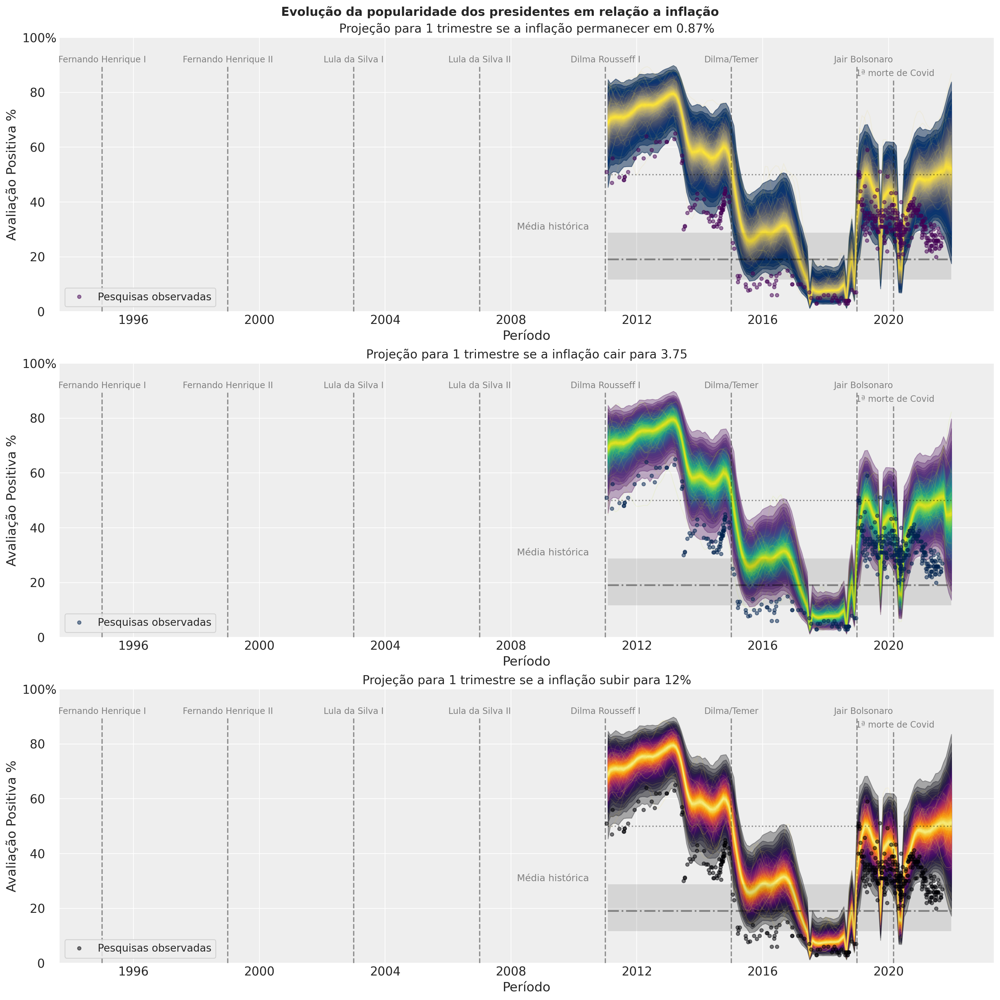

In [45]:
# collapse
_, (top, mid, low) = plt.subplots(
    3, 1, figsize=(16, 16), constrained_layout=True, sharey=True
)

pp_dates = pd.date_range(
    start=df.index[0] - np.timedelta64(0, "M"),
    periods=MAX_TEMPO,
    freq="M",
).values

# plot the samples from the gp posterior with samples and shading
pm.gp.util.plot_gp_dist(
    top,
    pp_prop_atual.stack(sample=("chain", "draw")).data.T,
    pp_dates,
    plot_samples=True,
    palette="cividis",
    fill_alpha=0.5,
)
pm.gp.util.plot_gp_dist(
    mid,
    pp_prop_03.stack(sample=("chain", "draw")).data.T,
    pp_dates,
    plot_samples=True,
    palette="viridis",
    fill_alpha=0.3,
)
pm.gp.util.plot_gp_dist(
    low,
    pp_prop_12.stack(sample=("chain", "draw")).data.T,
    pp_dates,
    plot_samples=True,
    palette="inferno",
    fill_alpha=0.3,
)

for ax, cmap, title in zip(
    (top, mid, low),
    (plt.cm.viridis(0), plt.cm.cividis(0), plt.cm.inferno(0)),
    (f"permanecer em {df.ipca_var_mensal.iloc[-1]}%", "cair para 3.75", "subir para 12%"),
):
    # plot data
    ax.plot(
        raw_polls.index,
        raw_polls.positiva.values,
        "o",
        ms=4,
        color=cmap,
        alpha=0.5,
        label="Pesquisas observadas",
    )

    # plot historical baseline
    ax.hlines(
        logistic(trace_inflacao.predictions["β0"].mean()),
        pp_dates[0],
        pp_dates[-1],
        "k",
        "-.",
        alpha=0.4,
        lw=2,
    )
    ax.fill_between(
        pp_dates,
        logistic(az.hdi(trace_inflacao.predictions)["β0"]).sel(hdi="lower"),
        logistic(az.hdi(trace_inflacao.predictions)["β0"]).sel(hdi="higher"),
        color="k",
        edgecolor="none",
        alpha=0.1,
    )
    ax.text(
        pd.to_datetime("2009-05-01"),
        0.3,
        "Média histórica",
        fontsize=11,
        color="grey",
        horizontalalignment="center",
    )

    # annotate graph
    ax.hlines(
        0.5,
        pp_dates[0],
        pp_dates[-1],
        "k",
        ":",
        alpha=0.4,
    )

    ax.vlines(pd.to_datetime("1995-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("1995-01-01"),
        0.91,
        "Fernando Henrique I",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    ax.vlines(pd.to_datetime("1999-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("1999-01-01"),
        0.91,
        "Fernando Henrique II",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    ax.vlines(pd.to_datetime("2003-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2003-01-01"),
        0.91,
        "Lula da Silva I",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    ax.vlines(pd.to_datetime("2007-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2007-01-01"),
        0.91,
        "Lula da Silva II",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    ax.vlines(pd.to_datetime("2011-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2011-01-01"),
        0.91,
        "Dilma Rousseff I",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )
    
    ax.vlines(pd.to_datetime("2015-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2015-01-01"),
        0.91,
        "Dilma/Temer",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    ax.vlines(pd.to_datetime("2019-01-01"), 0.0, 0.9, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2019-03-17"),
        0.91,
        "Jair Bolsonaro",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )
    
    ax.vlines(pd.to_datetime("2020-03-01"), 0.0, 0.85, "k", "--", alpha=0.4)
    ax.text(
        pd.to_datetime("2020-03-17"),
        0.86,
        "1ª morte de Covid",
        fontsize=10,
        color="grey",
        horizontalalignment="center",
    )

    # axis labels and title
    ax.set_ylim((0, 1))
    ax.set_xlabel("Período")
    ax.set_ylabel("Avaliação Positiva %")
    ax.set_title(
        f"Projeção para 1 trimestre se a inflação {title}",
        fontsize=14,
    )
    ax.legend(fontsize=12, loc="lower left", frameon=True)
    ax.set_yticklabels(labels = ['0   ', '20   ', '40   ', '60   ', '80   ', '100%'])
plt.suptitle(
    "Evolução da popularidade dos presidentes em relação a inflação",
    fontsize=14,
    fontweight="bold",
)

plt.savefig("../figures/gp-inflacao_popularidade")

Eu diria que o resultado parece muito bom! Conforme anunciado, para cada um dos três cenários contrafactuais, obtivemos uma distribuição completa de séries temporais - 1.000 delas para ser mais preciso, cada série temporal estendendo-se de 1995 ao mês atual + um trimestre.

In [46]:
# hide_input
%load_ext watermark
%watermark -a @dmarcelinobr -n -u -v -iv

Author: @dmarcelinobr

Last updated: Thu Sep 16 2021

Python implementation: CPython
Python version       : 3.9.6
IPython version      : 7.26.0

re        : 2.2.1
sys       : 3.9.6 | packaged by conda-forge | (default, Jul 11 2021, 03:36:15) 
[Clang 11.1.0 ]
sqlite3   : 2.6.0
logging   : 0.5.1.2
xarray    : 0.19.0
arviz     : 0.11.2
numpy     : 1.21.1
matplotlib: 3.4.2
csv       : 1.0
pymc3     : 3.11.2
watermark : 2.2.0
pandas    : 1.3.1

